In [1]:
import numpy as np
import matplotlib.pyplot as plt
import umap
import math
import numpy.linalg as la

In [2]:
#Fashion mnist
import pandas as pd  # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn import model_selection
from sklearn import linear_model, ensemble, tree, neighbors, svm
from mnist.loader import MNIST

In [3]:
print("Fetching Fashion-Mnist")
print("=========================")
mndata = MNIST('../fashion-mnist/data/fashion') #added path extension for new file structure
train, train_labels = mndata.load_training()
test, test_labels = mndata.load_testing()
data = np.array(np.vstack([train, test]), dtype=np.float64) / 255.0
target = np.hstack([train_labels, test_labels])
classes = [
    'T-shirt/top',
    'Trouser', 
    'Pullover',
    'Dress',
    'Coat',
    'Sandal',
    'Shirt',
    'Sneaker',
    'Bag',
    'Ankle boot']
print("Fashion-Mnist loaded")
print ("=========================")

Fetching Fashion-Mnist
Fashion-Mnist loaded


In [4]:
from __future__ import print_function
import cv2 as cv
import numpy as np
import argparse

## Completion bar 

In [5]:
import time, sys
from IPython.display import clear_output

def update_progress(progress):
    bar_length = 20
    if isinstance(progress, int):
        progress = float(progress)
    if not isinstance(progress, float):
        progress = 0
    if progress < 0:
        progress = 0
    if progress >= 1:
        progress = 1

    block = int(round(bar_length * progress))

    clear_output(wait = True)
    text = "Progress: [{0}] {1:.1f}%".format( "#" * block + "-" * (bar_length - block), progress * 100)
    print(text)

## Rotation scheme through opencv


In [6]:
def rotate(image, deg):
    src=image
    srcTri = np.array( [[0, 0], [src.shape[1] - 1, 0], [0, src.shape[0] - 1]] ).astype(np.float32)
    dstTri = np.array( [[0, src.shape[1]*0.33], [src.shape[1]*0.85, src.shape[0]*0.25], [src.shape[1]*0.15, src.shape[0]*0.7]] ).astype(np.float32)
    warp_mat = cv.getAffineTransform(srcTri, dstTri)
    warp_dst = cv.warpAffine(src, warp_mat, (src.shape[1], src.shape[0]))

    # Rotating the image after Warp
    center = (warp_dst.shape[1]//2, warp_dst.shape[0]//2)
    angle = deg
    scale = 1

    rot_mat = cv.getRotationMatrix2D( center, angle, scale )
    warp_rotate_dst = cv.warpAffine(src, rot_mat, (src.shape[1], src.shape[0]))
    tau=.1
    for j in range(warp_rotate_dst.shape[0]):
        for k in range(warp_rotate_dst.shape[0]):
            if warp_rotate_dst[j][k]<tau:
                warp_rotate_dst[j][k]=np.rint(warp_rotate_dst[j][k])
    return warp_rotate_dst

## Establishing Control Elements

In [210]:
neighbors=15
dim=2
epochs=500
dist=.2

In [211]:
reducer = umap.UMAP(random_state=42,n_epochs=epochs,n_components=dim, n_neighbors=neighbors,min_dist=dist,verbose=1)
embedding_control_2d = reducer.fit_transform(data)

UMAP(min_dist=0.2, n_epochs=500, random_state=42, verbose=1)
Thu Oct 13 16:12:16 2022 Construct fuzzy simplicial set
Thu Oct 13 16:12:16 2022 Finding Nearest Neighbors
Thu Oct 13 16:12:16 2022 Building RP forest with 18 trees
Thu Oct 13 16:12:17 2022 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	 4  /  16
	Stopping threshold met -- exiting after 4 iterations
Thu Oct 13 16:12:20 2022 Finished Nearest Neighbor Search
Thu Oct 13 16:12:20 2022 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Thu Oct 13 16:14:10 2022 Finished embedding


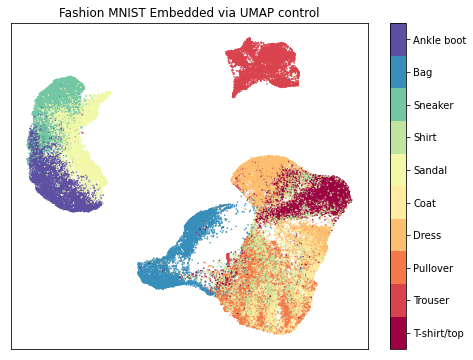

In [212]:
target = np.hstack([train_labels, test_labels])

fig, ax = plt.subplots(1, figsize=(8, 6))
plt.scatter(*embedding_control_2d.T, s=0.3, c=target, cmap='Spectral', alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(classes)
plt.title('Fashion MNIST Embedded via UMAP control');

## Scrambling the data
During this step its important to ensure that we end up with a set of rotated images such that they have uniform matrix dimensions 


In [7]:
#Generate list of rotations to randomly choose from 
N=10
phi = np.linspace(-N,N,1000)
phi = phi%(2*math.pi)
phi=np.degrees(phi)
phi=(np.floor(phi))
phi=phi.astype('int32')
print(np.random.choice(phi))

r_data=[]
for i in range(np.shape(data)[0]):
    theta=np.random.choice(phi)
    #print(i,theta)
    r_data.append(rotate(np.reshape(data[i],(28,28)),theta))
    update_progress(i / np.shape(data)[0])
    

Progress: [####################] 100.0%


In [215]:
print(data.shape)

n=np.shape(r_data[1])[0]**2
vectorize_r_data=np.zeros((np.shape(data)[0],n))
for i in range(len(r_data)):
    vectorize_r_data[i]=r_data[i].reshape(n)
print(vectorize_r_data.shape)

(70000, 784)
(70000, 784)


In [216]:
reducer = umap.UMAP(random_state=42,n_epochs=epochs,n_components=dim, n_neighbors=neighbors,min_dist=dist,verbose=1)
embedding_chaos = reducer.fit_transform(np.asarray(vectorize_r_data))

UMAP(min_dist=0.2, n_epochs=500, random_state=42, verbose=1)
Thu Oct 13 16:17:01 2022 Construct fuzzy simplicial set
Thu Oct 13 16:17:01 2022 Finding Nearest Neighbors
Thu Oct 13 16:17:01 2022 Building RP forest with 18 trees
Thu Oct 13 16:17:02 2022 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	 4  /  16
	Stopping threshold met -- exiting after 4 iterations
Thu Oct 13 16:17:05 2022 Finished Nearest Neighbor Search
Thu Oct 13 16:17:05 2022 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Thu Oct 13 16:18:51 2022 Finished embedding


In [217]:
target = np.hstack([train_labels, test_labels])

fig, ax = plt.subplots(1, figsize=(8, 6),dpi=1400)
plt.scatter(*embedding_chaos.T, s=0.3, c=target, cmap='Spectral', alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(classes)
plt.title('Fashion MNIST Embedded via UMAP chaos version');

In [234]:
x=1#single choice for testing
#forcing adjustment: 
U_control,s,v=la.svd(np.reshape(data[x],(28,28)))

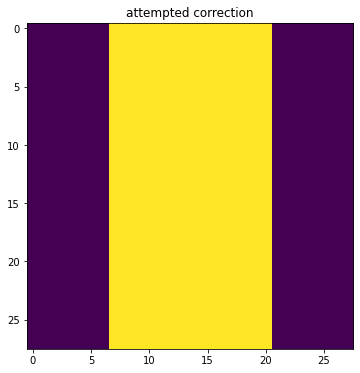

In [235]:
#Building a representative matrix
n=r_data[i].shape[0]
I_ex=np.zeros((n,n))
I_ex[:,int(n/4):3*int(n/4)] = 1
fig = plt.figure( figsize=(8, 6))
plt.title("attempted correction")
plt.imshow(I_ex, cmap='viridis')
plt.show()

In [242]:
t=r_data[x]
norms=[]
n=r_data[i].shape[0]
I=np.eye(n,n)
for i in range(0,360):
    t=rotate(r_data[x],i)
    U,S,V=la.svd(t)
    
    #Forcing 
    #norms.append(la.norm(U-U_control))
    
    #Experimental difference criteria
    #norms.append(la.norm(U-I))
    norms.append(la.norm(U-I_ex))

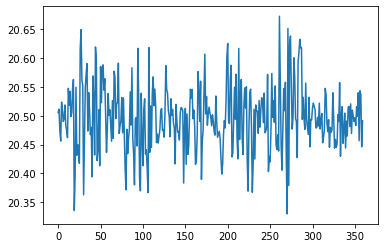

In [243]:
plt.plot(norms)

Perhaps it does not actually make much sense to compare the orthonormal basis of TA to the identity since we are not given that the columns of the orthonormal bais necessarily have values of 0 or 1, so there are two paths we can either find a way to reduce the orthonormal basis to something akin to a permutation matrix or we can shift our control basis to represent a more accurate description of the notion of "standard" 

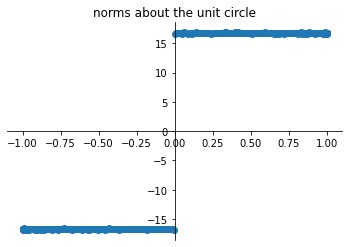

In [226]:
norms_p=norms
for i in range(360):
    if np.cos(l[i])<0:
        norms_p[i]=-norms[i]
fig = plt.figure()
#x = np.linspace(-np.pi, np.pi, 100)
#y = 2*np.sin(x)

ax = fig.add_subplot(111)
ax.set_title('norms about the unit circle')
ax.plot(np.cos(l),norms_p,'o')
ax.spines['left'].set_position('zero')
ax.spines['right'].set_color('none')
ax.spines['bottom'].set_position('zero')
ax.spines['top'].set_color('none')

# remove the ticks from the top and right edges
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')


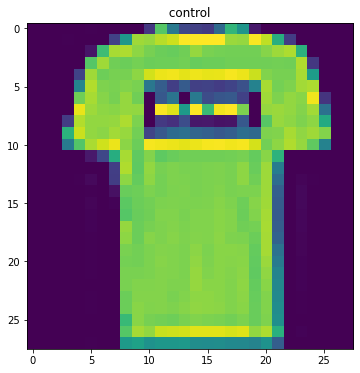

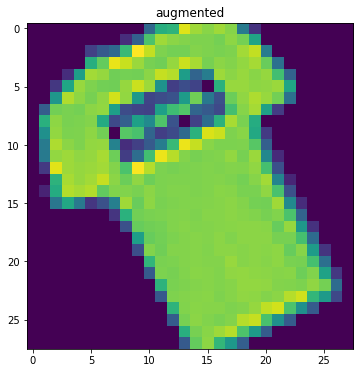

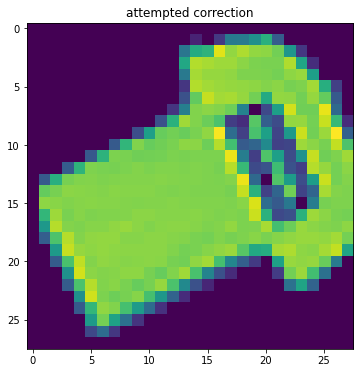

In [245]:
#control

fig = plt.figure( figsize=(8, 6))
plt.title(" control ")
plt.imshow(np.reshape(data[x],(28,28)), cmap='viridis')
plt.show()
#Augmented

fig = plt.figure( figsize=(8, 6))
plt.title("augmented")
plt.imshow(r_data[x], cmap='viridis')
plt.show()
#attempted correction
fig = plt.figure( figsize=(8, 6))
plt.title("attempted correction")
plt.imshow(rotate(r_data[x],np.argmin(norms)), cmap='viridis')
plt.show()

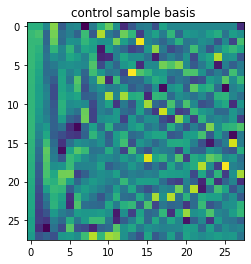

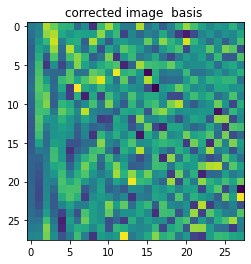

7.424855671742469


In [125]:

U_baseline,S,V=la.svd(np.reshape(data[i],(28,28)))
plt.imshow(U_baseline, cmap='viridis', interpolation='nearest')
plt.title("control sample basis ")
plt.show()

U,S,V=la.svd(rotate(r_data[1],np.argmin(norms)))
plt.title("corrected image  basis ")
plt.imshow(U, cmap='viridis', interpolation='nearest')
plt.show()
print(la.norm(U-U_baseline))

In [182]:
norms[211]
max(norms)
np.argmin(norms)

68